<a href="https://colab.research.google.com/github/shraavanchess2000/covid-weather-demographics/blob/main/Predicting_COVID_Cases_and_Deaths_from_Weather_and_Demographics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Code by Avinash Rajendra and Ilijana Mastilovic (co-contributors)

In [ ]:
!pip install plotly-geo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 23.7 MB 365 kB/s 


In [ ]:
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 13.5 MB/s 
     |████████████████████████████████| 7.8 MB 70.3 MB/s 
     |████████████████████████████████| 16.6 MB 50.4 MB/s 


In [ ]:
!pip install pyshp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 46 kB 3.6 MB/s 


In [ ]:
!pip install shapely

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 575 kB 11.6 MB/s 


In [ ]:
import os
import sys
import shap
import warnings
import geopandas
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
from contextlib import contextmanager
from google.colab import drive
from matplotlib import pyplot as plt
from sklearn.model_selection import KFold, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

In [ ]:
#Code for suppressing output from https://stackoverflow.com/questions/2125702/how-to-suppress-console-output-in-python

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:  
            yield
        finally:
            sys.stdout = old_stdout

In [ ]:
#Code to suppress warnings

warnings.filterwarnings("ignore")

In [ ]:
#Code to mount to Google Drive

drive.mount('/content/drive')

Mounted at /content/drive


#### Preprocess Initial Dataset (Run only for first time)

In [ ]:
#df = pd.read_csv('/content/drive/MyDrive/US_counties_COVID19_health_weather_data.csv')
#print(df)

In [ ]:
#df.shape

In [ ]:
#least_recent_date = df['date'].min()
#least_recent_date

In [ ]:
#most_recent_date = df['date'].max()
#most_recent_date

In [ ]:
#columns_to_keep = ['date', 'county', 'state', 'fips', 'cases', 'deaths', 'lat', 'lon', 'population_density_per_sqmi', 'percent_smokers', 'percent_adults_with_obesity', 'labor_force', 'percent_rural', 'percent_65_and_over', 'mean_temp', 'min_temp', 'max_temp', 'dewpoint', 'sea_level_pressure', 'max_wind_speed', 'wind_gust', 'precipitation', 'rain', 'snow', 'mean_temp_3d_avg', 'mean_temp_5d_avg', 'mean_temp_10d_avg', 'mean_temp_15d_avg', 'dewpoint_3d_avg', 'dewpoint_5d_avg', 'dewpoint_10d_avg', 'dewpoint_15d_avg']

In [ ]:
#len(columns_to_keep)

In [ ]:
#df1=df[columns_to_keep]

In [ ]:
#df1.shape

In [ ]:
#df1.to_csv('/content/drive/MyDrive/US_covid_weather.csv')

#### Load New Dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/US_covid_weather.csv')

Remove columns with invalid FIPS





In [ ]:
df.dropna(subset=['county', 'state', 'fips'], inplace=True) #Drop all nan values in the specified columns
df = df[df['fips'].apply(lambda x: str(x).isdigit())] #Drop any row that not have digit as fips

Add columns





In [ ]:
df['cases_per_capita_per_sqmi'] = df['cases']/df['population_density_per_sqmi']
df['deaths_per_capita_per_sqmi'] = df['deaths']/df['population_density_per_sqmi']

Group data by counties using FIPS number

### Visualizations

In [ ]:
def scatter_plotting_1(x, y, s, title, legend, xlabel, ylabel, cm):
    plt.figure(figsize=(9, 6))
    
    sc = plt.scatter(x, y, s, c=s, vmin=min(s), vmax=max(s), cmap=cm) #cmap="jet", marker="d", alpha=0.6) 
    
    plt.title(title)
    plt.legend([legend])
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.colorbar(sc)
    plt.show()

In [ ]:
def scatter_plotting_2(date, x, y, title, xlabel, ylabel):
    function_df = df.loc[df['date'] == date]
    x = function_df[x]
    y = function_df[y]

    plt.figure(figsize=(9, 6))
    
    plt.scatter(x, y) #cmap="jet", marker="d", alpha=0.6) 
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    plt.show()

In [ ]:
weather_visualization_df = df.dropna(subset=['population_density_per_sqmi', 'cases', 'deaths', 'mean_temp_15d_avg', 'dewpoint_15d_avg'], inplace=False) #Drop all nan values in the specified columns

In [ ]:
date = '2020-11-17'

##### a) Per-capita-per-sqmi cases/deaths vs. mean_temp_15d_avg

In [ ]:
x = weather_visualization_df.loc[df['date'] == date].population_density_per_sqmi

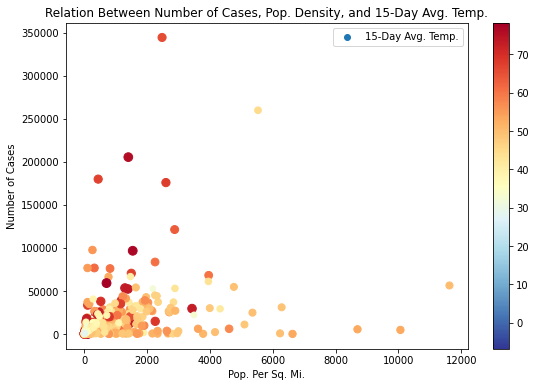

In [ ]:
y = weather_visualization_df.loc[df['date'] == date].cases
s = weather_visualization_df.loc[df['date'] == date].mean_temp_15d_avg

scatter_plotting_1(x, y, s, 'Relation Between Number of Cases, Pop. Density, and 15-Day Avg. Temp.', '15-Day Avg. Temp.', 'Pop. Per Sq. Mi.', 'Number of Cases', plt.cm.get_cmap('RdYlBu_r'))

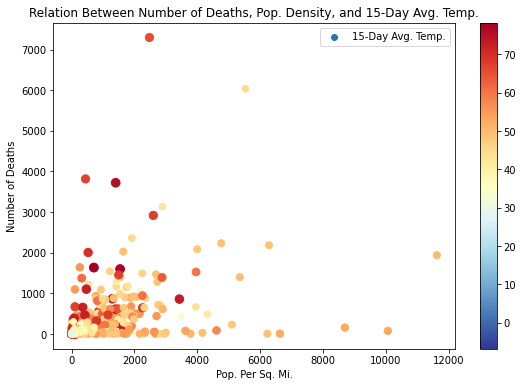

In [ ]:
y = weather_visualization_df.loc[df['date'] == date].deaths
s = weather_visualization_df.loc[df['date'] == date].mean_temp_15d_avg

scatter_plotting_1(x, y, s, 'Relation Between Number of Deaths, Pop. Density, and 15-Day Avg. Temp.', '15-Day Avg. Temp.', 'Pop. Per Sq. Mi.', 'Number of Deaths', plt.cm.get_cmap('RdYlBu_r'))

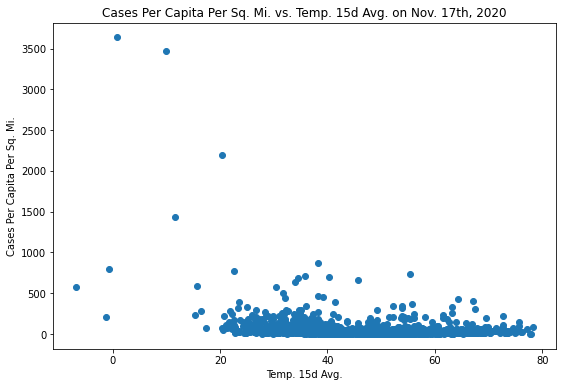

In [ ]:
scatter_plotting_2(date, 'mean_temp_15d_avg', 'cases_per_capita_per_sqmi', 'Cases Per Capita Per Sq. Mi. vs. Temp. 15d Avg. on Nov. 17th, 2020', 'Temp. 15d Avg.', 'Cases Per Capita Per Sq. Mi.')

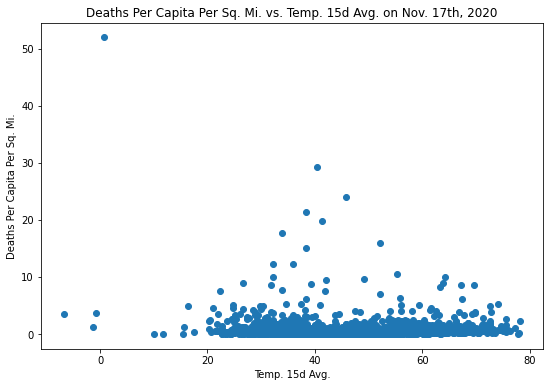

In [ ]:
scatter_plotting_2(date, 'mean_temp_15d_avg', 'deaths_per_capita_per_sqmi', 'Deaths Per Capita Per Sq. Mi. vs. Temp. 15d Avg. on Nov. 17th, 2020', 'Temp. 15d Avg.', 'Deaths Per Capita Per Sq. Mi.')

##### b) Per-capita-per-sqmi cases/deaths vs. dewpoint_15d_avg 

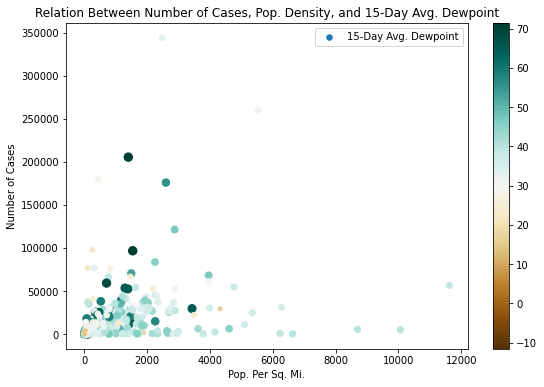

In [ ]:
y = weather_visualization_df.loc[df['date'] == date].cases
s = weather_visualization_df.loc[df['date'] == date].dewpoint_15d_avg

scatter_plotting_1(x, y, s, 'Relation Between Number of Cases, Pop. Density, and 15-Day Avg. Dewpoint', '15-Day Avg. Dewpoint', 'Pop. Per Sq. Mi.', 'Number of Cases', plt.cm.get_cmap('BrBG'))

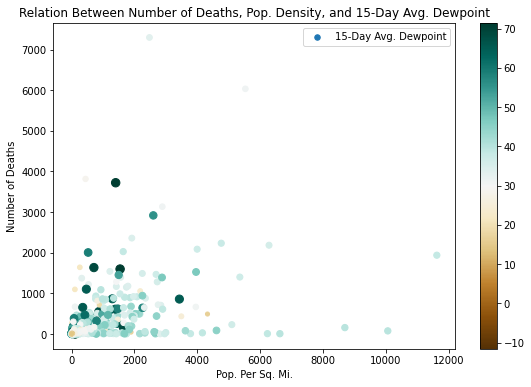

In [ ]:
y = weather_visualization_df.loc[df['date'] == date].deaths
s = weather_visualization_df.loc[df['date'] == date].dewpoint_15d_avg

scatter_plotting_1(x, y, s, 'Relation Between Number of Deaths, Pop. Density, and 15-Day Avg. Dewpoint', '15-Day Avg. Dewpoint', 'Pop. Per Sq. Mi.', 'Number of Deaths', plt.cm.get_cmap('BrBG'))

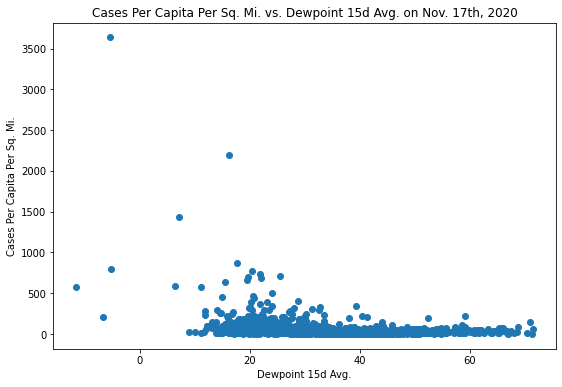

In [ ]:
scatter_plotting_2(date, 'dewpoint_15d_avg', 'cases_per_capita_per_sqmi', 'Cases Per Capita Per Sq. Mi. vs. Dewpoint 15d Avg. on Nov. 17th, 2020', 'Dewpoint 15d Avg.', 'Cases Per Capita Per Sq. Mi.')

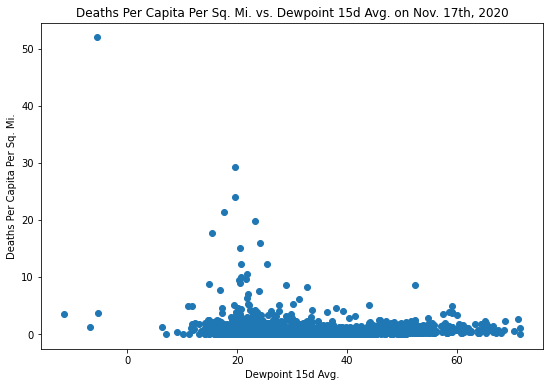

In [ ]:
scatter_plotting_2(date, 'dewpoint_15d_avg', 'deaths_per_capita_per_sqmi', 'Deaths Per Capita Per Sq. Mi. vs. Dewpoint 15d Avg. on Nov. 17th, 2020', 'Dewpoint 15d Avg.', 'Deaths Per Capita Per Sq. Mi.')

##### c.	Per-capita-per-sqmi cases/deaths by county

In [ ]:
def map_plot_by_date(dataframe, date, metric, title, legend_title, bins):
  function_df = dataframe.loc[df['date'] == date]

  fips = function_df.fips.tolist()
  values = function_df[metric].tolist()

  if (bins[-1] < max(function_df[metric])):
    bins.extend([max(function_df[metric])])

  fig = ff.create_choropleth(fips=fips, values=values, legend_title=legend_title,
                           title=title, binning_endpoints=bins)
  fig.layout.template = None
  fig.show()

  suppress_stdout()

In [ ]:
map_plot_by_date(df, date, 'cases', 'COVID Cases Across US on ' + date, 'Number of COVID Cases', [100, 200, 500, 1000, 2000, 5000, 10000, 20000, 50000, 100000, 200000])

In [ ]:
map_plot_by_date(df, date, 'cases_per_capita_per_sqmi', 'COVID Cases Per Capita Per Sq. Mi. Across US on ' + date, 'Number of COVID Cases Per Capita Per Sq. Mi.', [1, 5, 10, 20, 50, 100, 200, 500, 1000, 1500, 2000, 2500, 3000, 3500])

In [ ]:
map_plot_by_date(df, date, 'deaths', 'COVID Deaths Across US on ' + date, 'Number of COVID Deaths', [1, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000])

In [ ]:
map_plot_by_date(df, date, 'deaths_per_capita_per_sqmi', 'COVID Deaths Per Capita Per Sq. Mi. Across US on ' + date, 'Number of COVID Deaths Per Capita Per Sq. Mi.', [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50])

##### d) Mean_temp_15d_avg by county

In [ ]:
map_plot_by_date(weather_visualization_df, date, 'mean_temp_15d_avg', 'Temperature 15-Day Average on ' + date, 'Temperature (F)', [-10, 0, 10, 20, 30, 40, 50, 60, 70])

Note: The white spots above represent counties and county equivalents for which data are not available.

##### e) Dewpoint_temp_15d_avg by county 

In [ ]:
map_plot_by_date(weather_visualization_df, date, 'dewpoint_15d_avg', 'Dewpoint 15-Day Average on ' + date, 'Dewpoint (%)', [1, 10, 20, 30, 40, 50, 60, 70])

Note: The white spots above represent counties and county equivalents for which data are not available.

f) COVID cases over time in select counties (plot)

In [ ]:
def plot_cases(county, state):
  function_df = df[((df['county'] == county) & (df['state'] == state))]
  function_df.plot(x='date', y='cases', figsize=(9,6))
  plt.title(county + ' County, ' + state + ' Cases')
  plt.xlabel('Date')
  plt.ylabel('Number of Cases')
  plt.show()

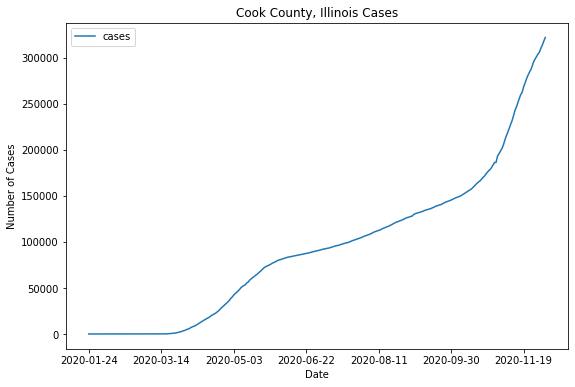

In [ ]:
plot_cases('Cook', 'Illinois')

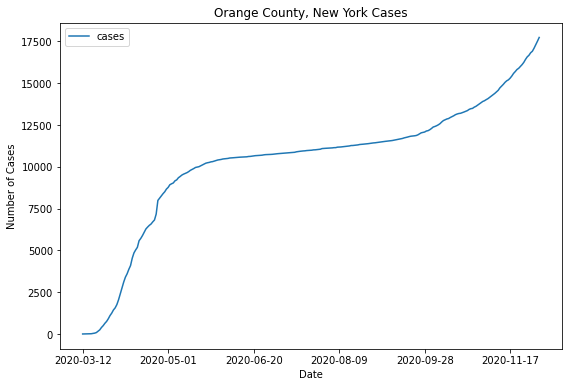

In [ ]:
plot_cases('Orange', 'New York')

g) COVID deaths over time in select counties (plot)

In [ ]:
def plot_deaths(county, state):
  function_df = df[((df['county'] == county) & (df['state'] == state))]
  function_df.plot(x='date', y='deaths', figsize=(9,6))
  plt.title(county + ' County, ' + state + ' Deaths')
  plt.xlabel('Date')
  plt.ylabel('Number of Deaths')
  plt.show()

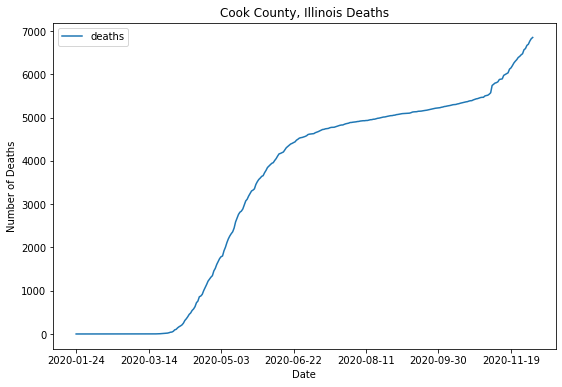

In [ ]:
plot_deaths('Cook', 'Illinois')

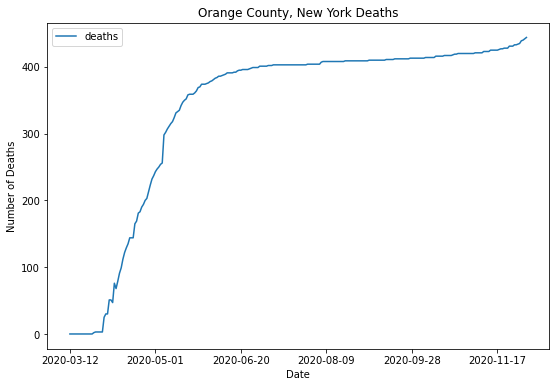

In [ ]:
plot_deaths('Orange', 'New York')

Note: In the above plot, there are a few kinks around the month of April where the number of deaths appears to go down. These are likely just statistical anomalies that can be mostly ignored in a larger context.

### Machine Learning

In [ ]:
def select_date_and_columns(date, columns):
  function_df = df.loc[df['date'] == date]
  function_df = function_df[columns]
  function_df.dropna(inplace=True)
  function_df.drop_duplicates('fips', keep='first')

  return function_df

In [ ]:
features = ['percent_smokers', 'percent_adults_with_obesity', 'percent_rural', 'percent_65_and_over', 'mean_temp_3d_avg', 'mean_temp_5d_avg', 'mean_temp_10d_avg', 'mean_temp_15d_avg', 'dewpoint_3d_avg', 'dewpoint_5d_avg', 'dewpoint_10d_avg', 'dewpoint_15d_avg']
targets = ['cases_per_capita_per_sqmi', 'deaths_per_capita_per_sqmi']
date = '2020-11-17'

In [ ]:
cases_index = 0
deaths_index = 1

In [ ]:
ml_df = select_date_and_columns(date, ['county', 'state', 'fips'] + features + targets)

X, y = ml_df[features], ml_df[targets]

In [ ]:
split_random_state = np.random.randint(0, 1000)

X, X_test, y, y_test = train_test_split(X, y, test_size=0.1, random_state=split_random_state)

def get_kfold_split(k):
    kf = KFold(n_splits=k, shuffle=True, random_state=split_random_state) #Entering the same random_state here ensures consistent results across all function calls for fair comparison among models

    return kf.split(X, y)

In [ ]:
def train_and_test_model(model):
  k = 10

  kf_split = get_kfold_split(k)

  avg_test_mse_cases = [None] * k
  avg_test_mse_deaths = [None] * k

  for i, (train_index, test_index) in enumerate(kf_split):
      X_train, X_test, y_train, y_test = X.iloc[train_index, :], X.iloc[test_index, :], y.iloc[train_index, :], y.iloc[test_index, :]
      
      model.fit(X_train, y_train)

      y_predicted_test = model.predict(X_test)

      test_mse = mean_squared_error(y_test, y_predicted_test, multioutput='raw_values')

      avg_test_mse_cases[i] = test_mse[cases_index]
      avg_test_mse_deaths[i] = test_mse[deaths_index]
            
      print('Iteration:', i, 'Test MSE Cases:', test_mse[cases_index], 'Test MSE Deaths:', test_mse[deaths_index])

  avg_test_mse_cases = np.mean(avg_test_mse_cases)
  avg_test_mse_deaths = np.mean(avg_test_mse_deaths)

  print('Average Test MSE Cases', avg_test_mse_cases)
  print('Average Test MSE Deaths', avg_test_mse_deaths)

  return model, avg_test_mse_cases, avg_test_mse_deaths

In [ ]:
shap_num_background_samples = 200 #200 takes a long time; maybe keep at 100

Linear Regression

In [ ]:
linear_regression_model, linear_regression_avg_test_mse_cases, linear_regression_avg_test_mse_deaths = train_and_test_model(LinearRegression())

Iteration: 0 Test MSE Cases: 16080.316265516178 Test MSE Deaths: 0.586513402524339
Iteration: 1 Test MSE Cases: 1772.1009172010254 Test MSE Deaths: 0.40864348286396296
Iteration: 2 Test MSE Cases: 3662.2010762160526 Test MSE Deaths: 0.7405988295986737
Iteration: 3 Test MSE Cases: 9949.630421516245 Test MSE Deaths: 1.605514094370955
Iteration: 4 Test MSE Cases: 2367.1313504686855 Test MSE Deaths: 0.5074130282600663
Iteration: 5 Test MSE Cases: 2506.712876298868 Test MSE Deaths: 0.5978257090832715
Iteration: 6 Test MSE Cases: 4471.509383666784 Test MSE Deaths: 2.221411827069251
Iteration: 7 Test MSE Cases: 48267.87262095916 Test MSE Deaths: 11.677783429948946
Iteration: 8 Test MSE Cases: 2377.3963654347795 Test MSE Deaths: 0.4403129215302502
Iteration: 9 Test MSE Cases: 3954.844384574342 Test MSE Deaths: 4.381342527711966
Average Test MSE Cases 9540.971566185213
Average Test MSE Deaths 2.316735925296168


In [ ]:
linear_regression_explainer = shap.KernelExplainer(linear_regression_model.predict,shap.sample(X_train, shap_num_background_samples))
linear_regression_shap_values = linear_regression_explainer.shap_values(X_test)

  0%|          | 0/283 [00:00<?, ?it/s]

In [ ]:
#Can develop UI (dropdown menu) to select label, as in https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/model_agnostic/Multioutput%20Regression%20SHAP.html

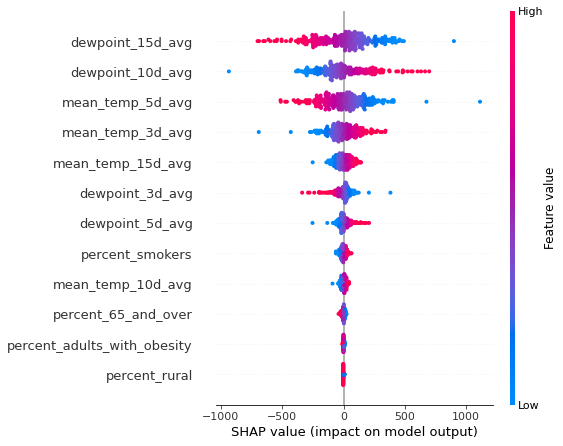

In [ ]:
shap.summary_plot(shap_values=linear_regression_shap_values[cases_index], features = X_test) #Cases

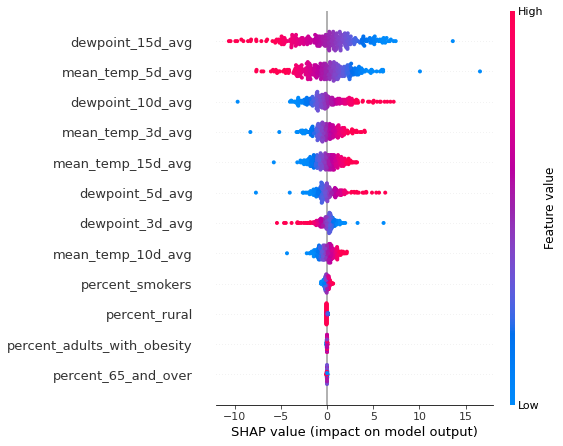

In [ ]:
shap.summary_plot(shap_values=linear_regression_shap_values[deaths_index], features = X_test) #Deaths

Random Forest

In [ ]:
random_forest_model, random_forest_avg_test_mse_cases, random_forest_avg_test_mse_deaths = train_and_test_model(RandomForestRegressor())

Iteration: 0 Test MSE Cases: 11766.980101631998 Test MSE Deaths: 0.6714522860416918
Iteration: 1 Test MSE Cases: 739.3681270414835 Test MSE Deaths: 0.34917861006086914
Iteration: 2 Test MSE Cases: 3195.5177342904854 Test MSE Deaths: 0.6086955185270153
Iteration: 3 Test MSE Cases: 4991.895113751307 Test MSE Deaths: 1.7378954537903413
Iteration: 4 Test MSE Cases: 1299.1173799398593 Test MSE Deaths: 0.6119769938867538
Iteration: 5 Test MSE Cases: 3878.1975326978645 Test MSE Deaths: 0.8977188209450082
Iteration: 6 Test MSE Cases: 11716.060459763748 Test MSE Deaths: 3.148477925692553
Iteration: 7 Test MSE Cases: 36265.610191688196 Test MSE Deaths: 10.485081884251636
Iteration: 8 Test MSE Cases: 1825.0094408795253 Test MSE Deaths: 0.43883802516495146
Iteration: 9 Test MSE Cases: 3417.641480130284 Test MSE Deaths: 4.02621950692928
Average Test MSE Cases 7909.539756181477
Average Test MSE Deaths 2.29755350252901


In [ ]:
random_forest_explainer = shap.KernelExplainer(random_forest_model.predict,shap.sample(X_train, shap_num_background_samples))
random_forest_shap_values = random_forest_explainer.shap_values(X_test)

  0%|          | 0/283 [00:00<?, ?it/s]

In [ ]:
#Can develop UI (dropdown menu) to select label, as in https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/model_agnostic/Multioutput%20Regression%20SHAP.html

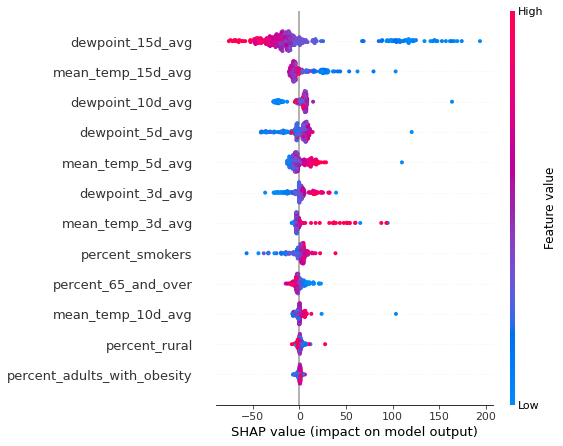

In [ ]:
shap.summary_plot(shap_values=random_forest_shap_values[cases_index], features = X_test) #Cases

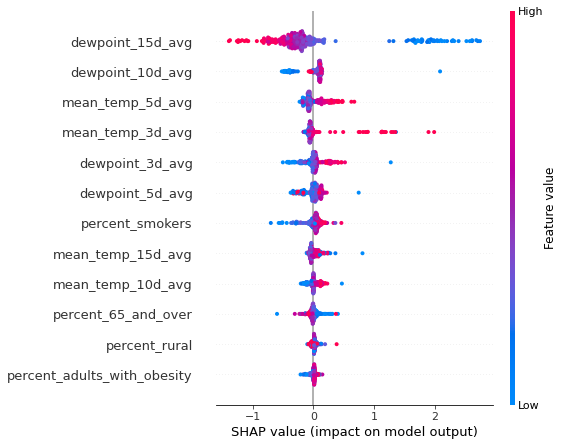

In [ ]:
shap.summary_plot(shap_values=random_forest_shap_values[deaths_index], features = X_test) #Deaths